# 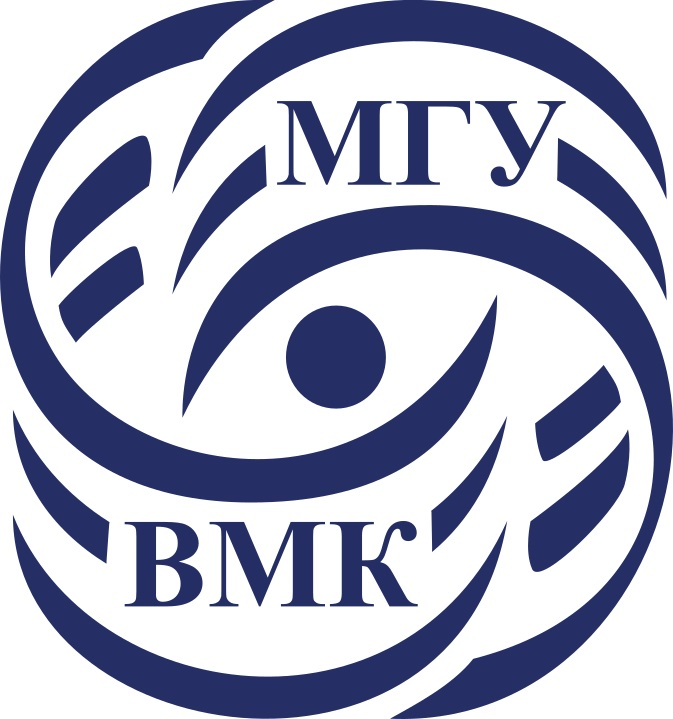

# Машинное обучение. ВМК МГУ

# Практическое задание 7: Кластеризация. Методы снижения размерности.
## Уровень: <font color='MediumSeaGreen'>**Исследовательский (Research)**</font>





# О формате сдачи

🔷 **<font color='plum'>При решении ноутбука используйте данный шаблон</font>**

    ✅ Можно добавлять новые ячейки любых типов
    ❌ Не нужно удалять текстовые ячейки c разметкой частей ноутбука и формулировками заданий


🔷 **<font color='plum'>При оценивании задач учитывается код</font>**

    ✅ Задания, в которых необходим код, обычно помечаются фразами "Your code here"/"Ваш код" и аналогичными
    ❌ Ответы на вопросы без сопутствующего кода оцениваются в 0 баллов
    ❌ Наличе работоспособного кода в ноутбуке, если на сказано иного, обязательно

🔷 **<font color='plum'>При оценивании задач учитываются выводы</font>**

    ✅ Задания, в которых необходимы выводы, обычно помечаются фразами Вывод"/"Ответ на вопрос"/"Ваш текст" и аналогичными
    ✅ Обычно выводы подразумевают под собой текстовый ответ (можно писать markdown, latex).
    ✅ Сопутствующие изображения, графики, таблички - приветствуются!
    ❌ При отсутствии выводов задание не засчитается на полный балл

-----------
<font color="white" style="opacity:0.2024"></font>







__В этом задании вы..:__

* Познакомитесь с одним способом визуализации процесса обучения
* Сравните между собой результаты разных способов кластеризации
* Посмотрите и реализуете несколько метрик качества кластеризации
* Попробуете разные методы снижения размерности

----

<font color="white" style="opacity:0.2024"></font>
<font color=DarkOrange>**Примерное время выполнения (execution time/время выполнения, если нажать run all) всех ячеек ноутбука при правильной реализации: 60 минут </font>**

----------------------------------------------
<font color="white" style="opacity:0.2023"></font>

Перед началом выполнения переведите ноутбук в `Доверенный режим` (`Trusted`) для корректного отображения изображений:

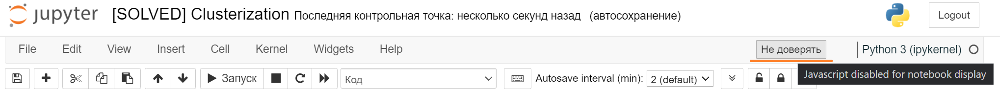

In [1]:
%config Completer.use_jedi = False
%load_ext autoreload
%autoreload 2

----------------------------------------------
<font color="white" style="opacity:0.2023"></font>

# Подготовка рабочей среды

Сначала установим нужные нам версии библиотек. Мы гарантируем, что в данных версиях задание будет корректно отрабатывать.

После установки нужных версий, **возможно,** нужно перезагрузить среду (runtime), но скорее всего вам это не понадобится


На скачивание файла и установку понадобится не более 5 минут.

<font color='OrangeRed'>**Важно!**</font>

Устанавливать нужные версии нужно каждый раз, когда создается новый рантайм. Например, если вы 2 часа подряд делаете это задание, то подготовить библиотеки достаточно 1 раз. Но если вы, например, начали в понедельник, затем закрыли/выключили ноутбук, то при продолжении в среду, вам нужно будет запустить рантайм заново и следовательно заново установить библиотеки.

<font color='OrangeRed'>**Важно!**</font>
Если вы предпочитаете делать практические задания на своем личном ноутбуке, то проверьте, что вы установили рабочее окружение в [соответствии с гайдом](https://github.com/MSU-ML-COURSE/ML-COURSE-24-25/blob/main/tutorials/%D0%A2%D1%83%D1%82%D0%BE%D1%80%D0%B8%D0%B0%D0%BB%20%D0%BF%D0%BE%20%D1%83%D1%81%D1%82%D0%B0%D0%BD%D0%BE%D0%B2%D0%BA%D0%B5%20%D1%80%D0%B0%D0%B1%D0%BE%D1%87%D0%B5%D0%B3%D0%BE%20%D0%BE%D0%BA%D1%80%D1%83%D0%B6%D0%B5%D0%BD%D0%B8%D1%8F%20%D0%B2%20Python%20%D0%B4%D0%BB%D1%8F%20%D1%80%D0%B5%D1%88%D0%B5%D0%BD%D0%B8%D1%8F%20%D0%B7%D0%B0%D0%B4%D0%B0%D1%87%20(2).pdf)

-----

<font color='OrangeRed'>**Важно!**</font> В этом задании мы будем использовать полное виртуальное окружение, так как понадобятся библиотеки `torch` и `tensorflow`

Обратите внимание, что установка `torch` и `tensorflow` через `pip `может сломать ваше окружение, особенно если вы используете GPU. Выполняйте их установку в соответствии с Вашей конфигурацией системы или в отдельном виртуальном окружении

In [3]:
! curl https://raw.githubusercontent.com/MSU-ML-COURSE/ML-COURSE-25-26/refs/heads/master/requirements/requirements.txt -o ./requirements_2025_26_for_colab_small.txt
! pip install -q -r ./requirements_2025_26_for_colab_small.txt

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   360  100   360    0     0    738      0 --:--:-- --:--:-- --:--:--   739


In [4]:
import catboost
assert(catboost.__version__ == '1.2.8')

Теперь можно приступать к выполнению задания! :)

-----------
<font color="white" style="opacity:0.2024"></font>

# 1 О задании

В данной работе вам предстоит познакомится с методами машинного обучения без учителя — кластеризацией и алгоритмами снижения размерности.

Рекомендуется использовать Kaggle так как в нём корректно работают интерактивные визуализации.

Здесь перечислены основные функции и библиотеки, которые могут понадобиться Вам в процессе выполнения задания. Подключение других библиотек возможно, но нежелательно. **Работа каких-либо других библиотек не гарантируется.**

In [5]:
import os

import gdown

import scipy

import numpy as np

import tqdm.auto as tqdm

import matplotlib
import matplotlib.pyplot as plt
from matplotlib.offsetbox import OffsetImage, AnnotationBbox

from ipywidgets import interactive, fixed, interact_manual, IntSlider, FloatLogSlider, FloatSlider

import torch
from torchvision.datasets import CIFAR10

# Необходима преварительная установка tensorflow
from keras.applications.inception_v3 import InceptionV3, preprocess_input

import sklearn

from sklearn.decomposition import KernelPCA
from sklearn.cluster import KMeans, DBSCAN, AgglomerativeClustering

# Библиотека umap-learn, а не umap
from umap import UMAP
from sklearn.manifold import TSNE, Isomap

from sklearn.model_selection import train_test_split
from sklearn.datasets import make_classification, make_moons, make_blobs
from sklearn.preprocessing import StandardScaler, MinMaxScaler

from warnings import simplefilter
from sklearn.exceptions import ConvergenceWarning
simplefilter("ignore", category=ConvergenceWarning)

Определим вспомогательную функцию для отрисовки двумерных кластеризованных данных. При выполенении задания желательно пользоваться этой функцией для визуализации. При необходимости можете менять сигнатуру и поведение функции как вам удобно, _оставляя стиль отрисовки в целом неизменным_.

In [6]:
def plot_2d_data(data, labels, title='Исходные данные', cmap='tab20', ax=None):
    '''
    Отрисовка 2d scatter plot.
    :param np.ndarray data: 2d массив точек
    :param Union[list, np.ndarray] labels: список меток для каждой точки выборки
    :param str title: Заголовок графика
    :param str cmap: Цветовая палитра
    :param ax Optional[matplotlib.axes.Axes]: Оси для отрисовки графика.
        Если оси не заданы, то создаётся новая фигура и сразу же происходит её отрисовка
        Иначе, график добавляется на существуюущие оси. Отрисовки фигуры не происходит
    '''
    n_clusters = len(np.unique(labels))

    if ax is None:
        fig, ax = plt.subplots(1, 1, figsize=(10, 5))
    else:
        fig = None

    scatter = ax.scatter(
        data[:, 0], data[:, 1], c=labels,
        cmap=plt.get_cmap(cmap, n_clusters)
    )

    cbar = plt.colorbar(scatter, label='Номер кластера', ax=ax)
    cbar.set_ticks(np.min(labels) + (np.arange(n_clusters) + 0.5) * (n_clusters - 1) / n_clusters)
    cbar.set_ticklabels(np.unique(labels))

    ax.set_title(title)
    ax.grid(True)

    if fig is not None:
        fig.tight_layout()
        plt.show()

Также используйте написанные реализации из [Base] задания:

In [7]:
def silhouette_score(x, labels):
    '''
    :param np.ndarray x: Непустой двумерный массив векторов-признаков
    :param np.ndarray labels: Непустой одномерный массив меток объектов
    :return float: Коэффициент силуэта для выборки x с метками labels
    '''

    x = np.asarray(x)
    labels = np.asarray(labels)

    unique_labels, inverse_labels, cluster_sizes = np.unique(
        labels,
        return_inverse=True,
        return_counts=True
    )

    n_objects = x.shape[0]
    n_clusters = unique_labels.size

    # если только один кластер, силуэт равен 0
    if n_clusters == 1:
        return 0.0

    distances = sklearn.metrics.pairwise_distances(x)

    # s_values[i] — среднее расстояние от объекта i до своего кластера
    s_values = np.zeros(n_objects, dtype=np.float64)

    # d_values[i] — минимальное среднее расстояние от объекта i до чужого кластера
    big_value = distances.max() + 1.0
    d_values = np.full(n_objects, big_value, dtype=np.float64)

    own_cluster_sizes = cluster_sizes[inverse_labels]

    for cluster_index in range(n_clusters):
        cluster_mask = inverse_labels == cluster_index
        cluster_size = cluster_sizes[cluster_index]

        # сумма расстояний от каждого объекта до объектов текущего кластера
        distance_sum_to_cluster = distances[:, cluster_mask].sum(axis=1)

        # среднее расстояние от каждого объекта до текущего кластера
        mean_distance_to_cluster = distance_sum_to_cluster / cluster_size

        # для объектов текущего кластера считаем s_i
        if cluster_size > 1:
            s_values[cluster_mask] = (
                distance_sum_to_cluster[cluster_mask] / (cluster_size - 1)
            )

        # для объектов не из текущего кластера обновляем d_i
        not_cluster_mask = ~cluster_mask
        d_values[not_cluster_mask] = np.minimum(
            d_values[not_cluster_mask],
            mean_distance_to_cluster[not_cluster_mask]
        )

    denominator = np.maximum(s_values, d_values)

    silhouette_values = np.divide(
        d_values - s_values,
        denominator,
        out=np.zeros(n_objects, dtype=np.float64),
        where=denominator > 0
    )

    # для одиночных объектов, считаем силуэт 0
    silhouette_values[own_cluster_sizes == 1] = 0.0

    return silhouette_values.mean()

def bcubed_score(true_labels, predicted_labels):
    '''
    :param np.ndarray true_labels: Непустой одномерный массив меток объектов
    :param np.ndarray predicted_labels: Непустой одномерный массив меток объектов
    :return float: B-Cubed для объектов с истинными метками true_labels и предсказанными метками predicted_labels
    '''

    true_labels = np.asarray(true_labels)
    predicted_labels = np.asarray(predicted_labels)

    # same_true_class[i, j] = True, если i и j в одном исходном классе
    same_true_class = true_labels[:, None] == true_labels[None, :]

    # same_predicted_cluster[i, j] = True, если i и j в одном кластере
    same_predicted_cluster = predicted_labels[:, None] == predicted_labels[None, :]

    # same_class_and_cluster[i, j] = True, если и то и другое
    same_class_and_cluster = same_true_class & same_predicted_cluster

    # intersection_sizes[i] = |L(i) ∩ C(i)|
    intersection_sizes = same_class_and_cluster.sum(axis=1).astype(np.float64)

    # predicted_cluster_sizes[i] = |C(i)|
    predicted_cluster_sizes = same_predicted_cluster.sum(axis=1).astype(np.float64)

    # true_class_sizes[i] = |L(i)|
    true_class_sizes = same_true_class.sum(axis=1).astype(np.float64)

    # precision_i = |L(i) ∩ C(i)| / |C(i)|
    precision = np.divide(
        intersection_sizes,
        predicted_cluster_sizes,
        out=np.zeros_like(intersection_sizes, dtype=np.float64),
        where=predicted_cluster_sizes > 0
    )

    # recall_i = |L(i) ∩ C(i)| / |L(i)|
    recall = np.divide(
        intersection_sizes,
        true_class_sizes,
        out=np.zeros_like(intersection_sizes, dtype=np.float64),
        where=true_class_sizes > 0
    )

    # усредняем precision и recall
    mean_precision = precision.mean()
    mean_recall = recall.mean()

    # F = 2 * precision * recall / (precision + recall)
    score = np.divide(
        2 * mean_precision * mean_recall,
        mean_precision + mean_recall,
        out=np.array(0.0),
        where=(mean_precision + mean_recall) > 0
    ).item()

    return score

## 1.1 Ещё несколько важных замечаний

При выполнении задания запрещено:
1. Менять те seed, которые явно указаны в коде
2. Менять прототипы функций, классов, методов классов
3. Менять константы, используемые для генерации выборок

При оформлении задания обратите внимание на форматирование кода и на оформление графиков:

* Весь код должен быть оформлен в строгом соответствии с [PEP8](https://pep8.org/)

Графики должны быть с одной стороны понятными и информативными, а с другой стороны *красивыми*. Вот несколько пунктов, которые помогут удовлетворить этим требования:
1. Все графики должны быть отрисованы в **векторном формате**. Обратите внимание, что смена режима графиков с динамического на статический и обратно может приводить к сбросу параметров отрисовки графиков. Переход в векторный режим можно выполнить с помощью команды `matplotlib_inline.backend_inline.set_matplotlib_formats('pdf', 'svg')`. Если изображения в векторном формате приводят к слишком большому размеру Jupyter Notebook можете использовать растровые изображения с **высоким dpi**. Напирмер, можно установить глобальный dpi в matplotlib: `matplotlib.rcParams['figure.dpi'] = 300`
2. На всех графиках без исключения должна быть нарисована сетка
3. Все графики и группы графиков должны иметь заголовок (`title`)
4. При необходимости оси должны быть подписаны
5. Если на графике отображено несколько сущностей (линии/точки/bar разных цветов, формы и так далее), то необходима исчерпывающая легенда
6. Все линии на графиках должны быть чётко видны (нет похожих цветов или цветов, сливающихся с фоном и так далее)
7. Масштаб по каждой оси на графике должен быть выбран правильно. Используйте масштабы `log`, `symlog` по необходимости
8. Если отображена величина, имеющая очевидный диапазон значений (например, проценты могут быть от 0 до 100), то желательно масштабировать ось на весь диапазон значений (исключением является случай, когда вам необходимо показать малое отличие, которое незаметно в таких масштабах)
9. Частота отметок по каждой оси должна быть тщательно подобрана, по необходимости задавайте `[xy]ticks`, `[xy]ticklabels` вручную. Подписи тиков на осях не должны сливаться как на одной оси, так и между ними
10. Помните, что matplotlib умеет выполнять [рендеринг Latex](https://matplotlib.org/stable/gallery/text_labels_and_annotations/tex_demo.html). Используйте эту возможность для написания формул в заголовках, легенде и в подписях осей
11. Используйте *красивую* цветовую палитру с хорошо различимыми цветами. Примеры цветовых палитр можно посмотреть [здесь](https://matplotlib.org/stable/gallery/color/colormap_reference.html). При наличи особенностей восприятия цвета можно использовать специальные палитры:
```python
plt.style.use('seaborn-colorblind')
# Или
plt.style.use('tableau-colorblind10')
# Затем, при отрисовке графиков не используйте параметр cmap
```
12. Графики должны быть не супер-микро и не супер-макро по размерам, так, чтобы можно было увидеть все, что нужно

----------------------------------------------
<font color="white" style="opacity:0.2023"></font>

# <font color='DarkOrange'>2. Кластеризация "естественных" данных.</font>

Синтетические данные имеют достаточно простую структуру, поэтому методы снижения размерности позволяют получать хорошее низкоразмерное представление с достаточно выраженными кластерами. Однако, реальные данные могут быть устроены существенно сложнее. Посмотрим как поведут себя методы снижения размерности на датасете с картинками CIFAR10.

Загрузим датасет. Будем использовать только часть обучающей выборки, чтобы ускорить вычисления на высокоразмерных данных.

In [8]:
cifar10_test_dataset = CIFAR10('./cifar10', train=False, download=True)
cifar10_train_dataset = CIFAR10('./cifar10', train=True, download=False)

cifar10_labels_test = np.array(cifar10_test_dataset.targets)
cifar10_labels_train = np.array(cifar10_train_dataset.targets)

cifar10_images_test = cifar10_test_dataset.data
cifar10_images_train = cifar10_train_dataset.data

cifar10_images_train, _, cifar10_labels_train, _ = train_test_split(
    cifar10_images_train, cifar10_labels_train,
    train_size=cifar10_images_test.shape[0], stratify=cifar10_labels_train, random_state=6886
)

cifar10_data_test = (cifar10_images_test.astype(np.float32) / 255.0).reshape([cifar10_images_test.shape[0], -1])
cifar10_data_train = (cifar10_images_train.astype(np.float32) / 255.0).reshape([cifar10_images_train.shape[0], -1])

Отобразим данные в проекции на две случайные оси. Для удобства воспользуемся здесь ещё одним вариантом динамического контента в jupyter notebook — при наведении на точку на графике будем отображать исходную картинку.

In [9]:
def plot_interactive(lowd_data, images, labels, names, n_dots=1000, image_scale=1.0):
    with matplotlib.rc_context(rc={
        'font.size': image_scale * matplotlib.rcParams['font.size'],
        'xtick.major.size': image_scale * matplotlib.rcParams['xtick.major.size'],
        'xtick.minor.size': image_scale * matplotlib.rcParams['xtick.minor.size'],
        'ytick.major.size': image_scale * matplotlib.rcParams['ytick.major.size'],
        'ytick.minor.size': image_scale * matplotlib.rcParams['ytick.minor.size'],

        'axes.linewidth': image_scale * matplotlib.rcParams['axes.linewidth'],
        'grid.linewidth': image_scale * matplotlib.rcParams['grid.linewidth'],
        'patch.linewidth': image_scale * matplotlib.rcParams['patch.linewidth'],
        'xtick.major.width': image_scale * matplotlib.rcParams['xtick.major.width'],
        'xtick.minor.width': image_scale * matplotlib.rcParams['xtick.minor.width'],
        'ytick.major.width': image_scale * matplotlib.rcParams['ytick.major.width'],
        'ytick.minor.width': image_scale * matplotlib.rcParams['ytick.minor.width'],

        'lines.markeredgewidth': image_scale * matplotlib.rcParams['lines.markeredgewidth'],
    }):
        fig, ax = plt.subplots(1, 1, figsize=(image_scale * 10, image_scale * 5))
        fig.set_dpi(300)
        ax.grid(True)

        n_clusters = len(np.unique(labels))

        scatter = plt.scatter(
            lowd_data[:n_dots, 0], lowd_data[:n_dots, 1], s=image_scale * 10,
            c=labels[:n_dots], cmap=plt.get_cmap('tab20', n_clusters), edgecolors='none'
        )

        cbar = plt.colorbar(scatter, ax=ax, label='Название кластера')
        cbar.set_ticks(np.min(labels[:n_dots]) + (np.arange(n_clusters) + 0.5) * (n_clusters - 1) / n_clusters)
        cbar.set_ticklabels(names)

        offset_image = OffsetImage(images[0], zoom=image_scale * 2.0)
        ann_bbox = AnnotationBbox(
            offset_image, (0,0), xybox=(image_scale * 50., image_scale * 50.), xycoords='data',
            boxcoords="offset points", pad=0.3, arrowprops=dict(
                arrowstyle='->, head_length={0:.2f}, head_width={1:.2f}'.format(
                    image_scale * 0.4, image_scale * 0.2
                )
            )
        )
        ax.add_artist(ann_bbox)
        ax.set_title('Распределение данных CIFAR10 в проекции на 2 случайные оси')
        ann_bbox.set_visible(False)

        def image_hover(event):
            if scatter.contains(event)[0]:
                ind, *_ = scatter.contains(event)[1]["ind"]
                w, h = fig.get_size_inches() * fig.dpi
                ws = (event.x > w / 2.) * -1 + (event.x <= w / 2.)
                hs = (event.y > h / 2.) * -1 + (event.y <= h / 2.)
                ann_bbox.xybox = (image_scale * 50.0 * ws, image_scale * 50.0 * hs)
                ann_bbox.set_visible(True)
                ann_bbox.xy =(lowd_data[ind, 0], lowd_data[ind, 1])
                offset_image.set_data(images[ind])
            else:
                ann_bbox.set_visible(False)
            fig.canvas.draw_idle()

        fig.canvas.mpl_connect('motion_notify_event', image_hover)

        plt.show()

In [10]:
%matplotlib ipympl
matplotlib.rcParams['figure.dpi'] = 300

# Для работы в Google Colab нужно выполнить специфичную магию
# Обычно, она не срабатывает с первого раза, поэтому может потребоваться
#   несколько раз выполнить ячейку и несколько раз попробовать нарисовать график
try:
    from google.colab import output
    output.enable_custom_widget_manager()
except:
    pass

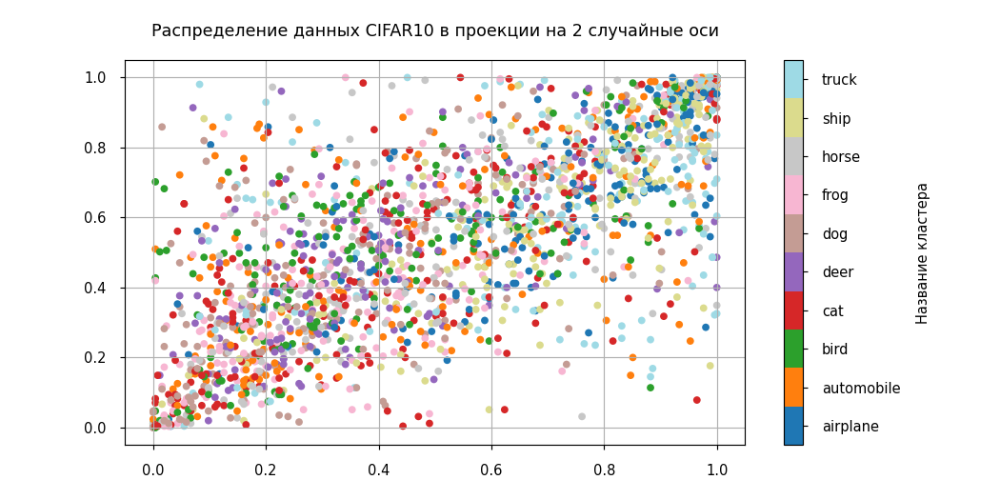

In [11]:
# Если картинка окажется слишком маленькой/большой, то поменяйте image_scale на подходящее значение
plot_interactive(
    cifar10_data_train[:, [17, 64]], cifar10_images_train, cifar10_labels_train,
    cifar10_test_dataset.classes, n_dots=2000, image_scale=0.35
)

Вернёмся в статичный режим отрисовки изображений:

In [12]:
%matplotlib inline
matplotlib.rcParams['figure.dpi'] = 300

#### <font color='DarkOrange'>**Задание 2.1 [кросспроверка, 1 балл][код]**
<a id='task_2.1'></a></font>
Воспользуйтесь алгоритмами снижения размерности `TSNE`, `UMAP`, `Isomap`, `KernelPCA` для визуализации картинок.

Постройте визуализацию низкоразмерного представления, полученного с помощью этих моделей — изобразите четыре графика в одной строке. Во второй строке отобразите результат применения обученных моделей на тестовой выборке. Если для данного алгоритма невозможно сделать предсказания на тестовой выборке — оставьте соответствующий график пустым. Обозначьте разными цветами разные классы объектов. Для повышения производительности можете отобразить только часть выборки на графике ($1000\text{-}2000$ объектов).

<font color='OrangeRed'>**Замечание:**</font>  обратите внимание, что все алгоритмы снижения размерности также требуют правильного масштабирования признаков, для корректной работы и интерпретируемых результатов.

In [13]:
n_samples = 2000
random_state = 42

rng = np.random.default_rng(random_state)

# выбор случайных индексов объектов
train_indices = rng.choice(cifar10_data_train.shape[0], n_samples, replace=False)
test_indices = rng.choice(cifar10_data_test.shape[0], n_samples, replace=False)

# нормализация признаков
scaler = StandardScaler()
cifar10_data_train_scaled = scaler.fit_transform(cifar10_data_train)
cifar10_data_test_scaled = scaler.transform(cifar10_data_test)

X_train_sample = cifar10_data_train_scaled[train_indices]
y_train_sample = cifar10_labels_train[train_indices]

X_test_sample = cifar10_data_test_scaled[test_indices]
y_test_sample = cifar10_labels_test[test_indices]

In [28]:
# похожие объекты рядом, непохожие дальше друг от друга
tsne = TSNE(
    n_components=2,
    perplexity=30,  # сколько соседей учитывать вокруг каждой точки
    max_iter=1000,
    n_jobs=-1,
    random_state=random_state
)

# быстрее чем t-SNE, умеет делать transform для новых данных
umap = UMAP(
    n_components=2,
    n_neighbors=30,  # сколько соседей учитывать
    min_dist=0.1,  # насколько близко могут располагаться точки в итоге
    metric='euclidean',  # расстояние считать по евклидовой метрике
    random_state=random_state
)

# строит граф соседей и пытается сохранить расстояния вдоль этого графа
isomap = Isomap(
    n_components=2,
    n_neighbors=30,
    n_jobs=-1
)

# нелинейный PCA: сначала переводит данные в другое пространство, а потом PCA
# обычный PCA ищет линейные направления максимального разброса данных
kpca = KernelPCA(
    n_components=2,
    kernel='rbf',
    gamma=None,  # параметр выбирается автоматически
    n_jobs=-1
)

models = {
    "t-SNE": tsne,
    "UMAP": umap,
    "Isomap": isomap,
    "KernelPCA (RBF)": kpca
}

/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


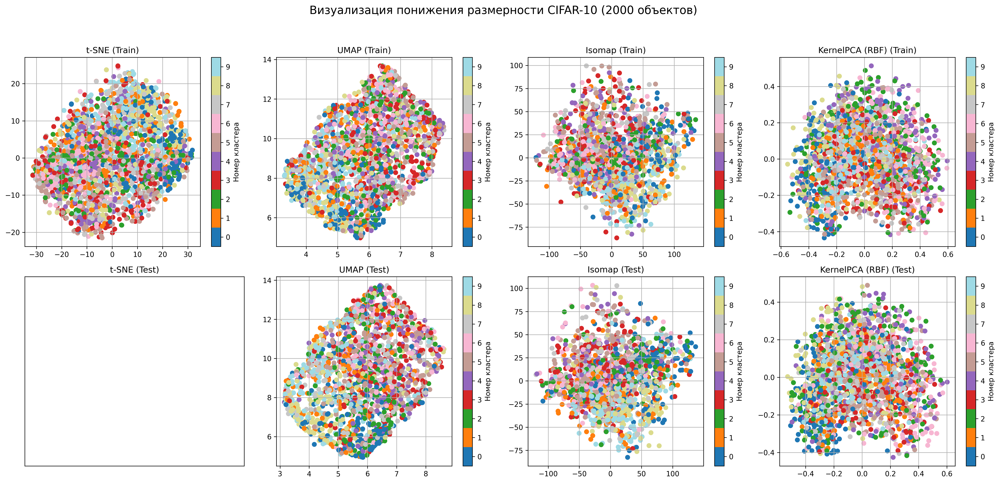

In [29]:
fig, axes = plt.subplots(2, 4, figsize=(20, 10))
fig.suptitle(
    f"Визуализация понижения размерности CIFAR-10 ({n_samples} объектов)",
    fontsize=16
)

for i, (name, model) in enumerate(models.items()):

    if name == "t-SNE":
        X_train_reduced = model.fit_transform(X_train_sample)
    else:
        model.fit(X_train_sample)
        X_train_reduced = model.transform(X_train_sample)

    plot_2d_data(
        X_train_reduced,
        y_train_sample,
        title=f'{name} (Train)',
        ax=axes[0, i]
    )

    try:
      X_test_reduced = model.transform(X_test_sample)

      plot_2d_data(
          X_test_reduced,
          y_test_sample,
          title=f'{name} (Test)',
          ax=axes[1, i]
      )
    except:
      axes[1, i].set_title(f'{name} (Test)')
      axes[1, i].set_xticks([])
      axes[1, i].set_yticks([])

plt.tight_layout(rect=(0, 0.03, 1, 0.95))
plt.show()

In [31]:
print(cifar10_data_train.shape)

(10000, 3072)


#### <font color='DarkOrange'>**Задание 2.2 [кросспроверка, 1 балл][вопрос]**</font>
Опишите увиденное. Почему алгоритмы могли отработать не так, как вы ожидали?

<font color='MediumOrchid'>**Ваш ответ здесь:**</font>

Ни один из методов понижения размерности не дал хорошего разделения по кластерам. Так же из-за особенностей реализации (не предназначена для трансформации новых данных отдельно от обучения) `t-SNE` график пуст.

Такой результат может отличаться от ожидаемого, потому что
1. данные CIFAR-10 представлены как исходные пиксельные признаки. Евклидово расстояние между векторами пикселей плохо отражает смысловую близость изображений. Поэтому методы понижения размерности сохраняют не семантические классы, а геометрическую близость в пространстве пикселей.
2. исходное пространство имеет 3072 измерения, а сжимаем до 2, т.е. получаем экстремальное понижение размерности.

#### <font color='DarkOrange'>**Задание 2.3 [кросспроверка, 1 балл][вопрос]**</font>
Методы снижения размерности, как и другие метрические методы испытывают трудности при работе с данными высокой размерности. Напишите как минимум две причины, почему.

<font color='MediumOrchid'>**Ваш ответ здесь:**</font>

1. В высокой размерности расстояния между объектами становятся менее информативными. Часто расстояние до ближайшего соседа и расстояние до дальнего соседа начинают отличаться не так сильно. Поэтому метрические методы могут плохо понимать, какие объекты действительно похожи.
2. В данных высокой размерности может быть много шума или слабо информативных признаков. Эти признаки начинают влиять на расстояния между объектами и могут скрывать полезную структуру данных.

Один из способов решения этих проблем — перейти в другое, более репрезентативное пространство признаков, где объекты будут расположены в многообразии, которое легче представить в двумерном пространстве. Чтобы выполнить такое преобразование воспользуемся типичным подходом **Transfer Learning** — предобученными нейронными сетями. С помощью глубокой сети обученной на другом наборе изображений (`ImageNet`) мы перейдём в новое векторное пространство и затем применим методы снижения размерности.

Так как локальный подсчёт эмбеддингов изображений может занять много времени, Вы можете попробовать скачать их c помощью `gdown`:

In [32]:
gdown.download(id='16UgWo1Emt9ar1O4h2Xxed0ZpJZ0OG5V-', output='cifar10_deep_features.npy')

Downloading...
From (original): https://drive.google.com/uc?id=16UgWo1Emt9ar1O4h2Xxed0ZpJZ0OG5V-
From (redirected): https://drive.google.com/uc?id=16UgWo1Emt9ar1O4h2Xxed0ZpJZ0OG5V-&confirm=t&uuid=edf48d38-b7dd-4b28-ad43-b28e13611a01
To: /content/cifar10_deep_features.npy
100%|██████████| 164M/164M [00:07<00:00, 22.8MB/s]


'cifar10_deep_features.npy'

In [33]:
FEATURES_PATH = './cifar10_deep_features.npy'

if not os.path.exists(FEATURES_PATH):
    deep_cnn = InceptionV3(weights='imagenet', include_top=False, input_shape=(139, 139, 3))

    cifar10_tensors_test = torch.nn.functional.interpolate(torch.tensor(
        cifar10_images_test.transpose(0, 3, 1, 2)
    ), size=139).numpy().transpose(0, 2, 3, 1).astype(np.float32)
    cifar10_tensors_train = torch.nn.functional.interpolate(torch.tensor(
        cifar10_images_train.transpose(0, 3, 1, 2)
    ), size=139).numpy().transpose(0, 2, 3, 1).astype(np.float32)

    cifar10_deep_features_test = deep_cnn.predict(
        preprocess_input(cifar10_tensors_test)
    ).mean(axis=(1, 2)).reshape([cifar10_tensors_test.shape[0], -1])
    cifar10_deep_features_train = deep_cnn.predict(
        preprocess_input(cifar10_tensors_train)
    ).mean(axis=(1, 2)).reshape([cifar10_tensors_train.shape[0], -1])

    np.save(FEATURES_PATH, [cifar10_deep_features_test, cifar10_deep_features_train])
else:
    cifar10_deep_features_test, cifar10_deep_features_train = np.load(FEATURES_PATH, allow_pickle=True)

#### <font color='DarkOrange'>**Задание 2.4 [кросспроверка, 2 баллa][код]**</font>
Используйте выделенные признаки для обучения алгоритмов из предыдущего пункта. Постройте графики. Замечание из пункта [**2.1**](#task_2.1) остаётся в силе.

/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


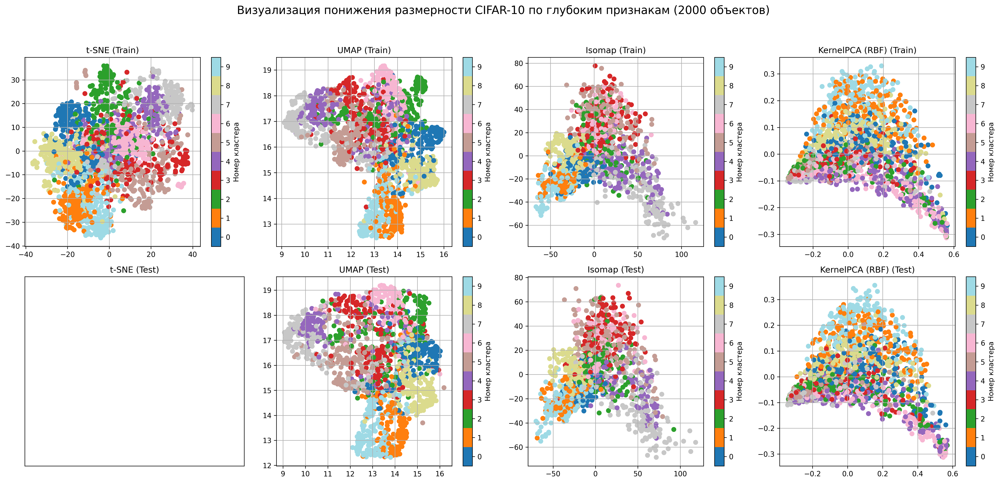

In [34]:
# нормализация глубоких признаков
scaler = StandardScaler()
cifar10_deep_features_train_scaled = scaler.fit_transform(cifar10_deep_features_train)
cifar10_deep_features_test_scaled = scaler.transform(cifar10_deep_features_test)

# используем те же индексы, что и в задании 2.1
X_train_sample = cifar10_deep_features_train_scaled[train_indices]
y_train_sample = cifar10_labels_train[train_indices]

X_test_sample = cifar10_deep_features_test_scaled[test_indices]
y_test_sample = cifar10_labels_test[test_indices]

# похожие объекты рядом, непохожие дальше друг от друга
tsne = TSNE(
    n_components=2,
    perplexity=30,  # сколько соседей учитывать вокруг каждой точки
    max_iter=1000,
    n_jobs=-1,
    random_state=random_state
)

# быстрее чем t-SNE, умеет делать transform для новых данных
umap = UMAP(
    n_components=2,
    n_neighbors=30,  # сколько соседей учитывать
    min_dist=0.1,  # насколько близко могут располагаться точки в итоге
    metric='euclidean',  # расстояние считать по евклидовой метрике
    random_state=random_state
)

# строит граф соседей и пытается сохранить расстояния вдоль этого графа
isomap = Isomap(
    n_components=2,
    n_neighbors=30,
    n_jobs=-1
)

# нелинейный PCA: сначала переводит данные в другое пространство, а потом PCA
# обычный PCA ищет линейные направления максимального разброса данных
kpca = KernelPCA(
    n_components=2,
    kernel='rbf',
    gamma=None,  # параметр выбирается автоматически
    n_jobs=-1
)

models = {
    "t-SNE": tsne,
    "UMAP": umap,
    "Isomap": isomap,
    "KernelPCA (RBF)": kpca
}

fig, axes = plt.subplots(2, 4, figsize=(20, 10))
fig.suptitle(
    f"Визуализация понижения размерности CIFAR-10 по глубоким признакам ({n_samples} объектов)",
    fontsize=16
)

for i, (name, model) in enumerate(models.items()):

    if name == "t-SNE":
        X_train_reduced = model.fit_transform(X_train_sample)
    else:
        model.fit(X_train_sample)
        X_train_reduced = model.transform(X_train_sample)

    plot_2d_data(
        X_train_reduced,
        y_train_sample,
        title=f'{name} (Train)',
        ax=axes[0, i]
    )

    try:
      X_test_reduced = model.transform(X_test_sample)

      plot_2d_data(
          X_test_reduced,
          y_test_sample,
          title=f'{name} (Test)',
          ax=axes[1, i]
      )
    except:
      axes[1, i].set_title(f'{name} (Test)')
      axes[1, i].set_xticks([])
      axes[1, i].set_yticks([])

plt.tight_layout(rect=(0, 0.03, 1, 0.95))
plt.show()

#### <font color='DarkOrange'>**Задание 2.5 [кросспроверка, 1 балл][вопрос]**</font>
1. Есть ли какие-то изменения по сравнению с использованием исходных признаков?
2. Как вы думаете, почему использование глубоких признаков помогло/не помогло в задаче снижения размерности?
3. Какой алгоритм показал себя лучше на ваш взгляд?
4. Согласованы ли преобразования на обучающей и тестовых выборках? Какие недостатки есть в том, что преобразование на тестовой выборке выглядит отлично от низкоразмерного представления обучающей выборки?
5. Какие из алгоритмов можно использовать в качестве первого шага по снижению размерности в задачах машинного обучения? Какой из них использовали бы вы?

<font color='MediumOrchid'>**Ваш ответ здесь:**</font>

1. При переходе к глубоким признакам, разделение на кластеры стало более четким.
2. Использование глубоких признаков помогло, потому что они содержат более содержательную информацию об изображении. Поэтому расстояния между объектами в таком признаковом пространстве лучше отражают сходство изображений.
3. Лучше всего показал себя UMAP: четкая структура кластеров, преобразование train и test выглядит похожим.
4. Преобразования выглядят согласованными. Однако все равно преобразование test немного отличается от train. Это связано с тем, что тестовые объекты являются новыми точками, и при переносе в низкоразмерное пространство хуже сохраняется локальная структура.
5. Лучше использовать алгоритмы, которые дают устойчивое преобразование и умеют применять его к новым данным. Поэтому наиболее подходящим вариантом я считаю UMAP.

Далее, для визуализации кластеризации используйте один из методов снижения размерности на ваш выбор и то векторное представление, которое лучше всего себя проявило (исходное или полученное с помощью глубокой сети). Кластеризацию обучайте также на наиболее подходящем высокоразмерном векторном представлении.

#### <font color='DarkOrange'>**Задание 2.6 [кросспроверка, 1 балл][код, вопрос]**</font>
Изобразите выборку CIFAR10 с помощью выбранного алгоритма снижения размерности.

<font color='LightSteelBlue'>**Совет**</font> Изобразите результат с помощью `plot_interactive`, чтобы изучить особенности кластеризации в соответствии с исходными изображениями. Если вы нашли интересные особенности — напишите про это.

In [35]:
%matplotlib ipympl
matplotlib.rcParams['figure.dpi'] = 300

# Для работы в Google Colab нужно выполнить специфичную магию
# Обычно, она не срабатывает с первого раза, поэтому может потребоваться
#   несколько раз выполнить ячейку и несколько раз попробовать нарисовать график
try:
    from google.colab import output
    output.enable_custom_widget_manager()
except:
    pass

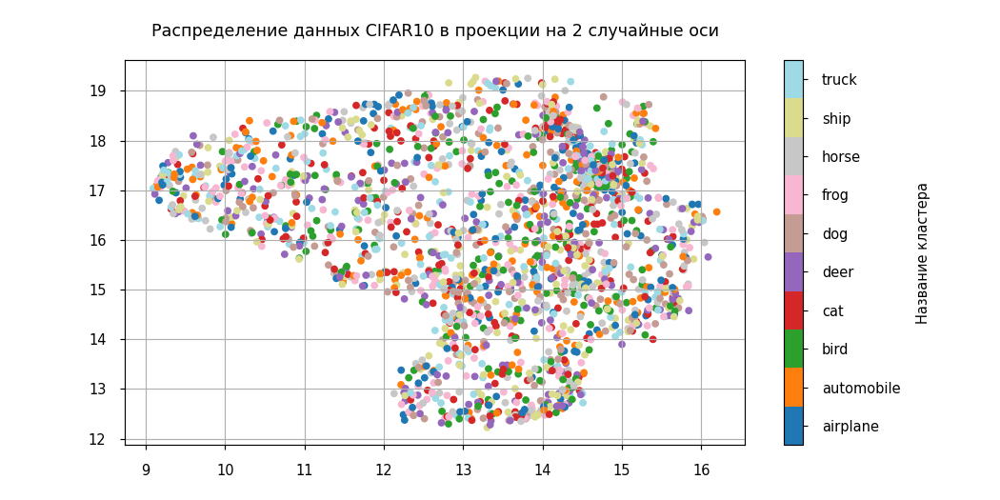

In [36]:
plot_interactive(
    umap.transform(cifar10_deep_features_train_scaled), cifar10_images_train, y_train_sample,
    cifar10_test_dataset.classes, n_dots=2000, image_scale=0.35
)

Вернёмся в статичный режим отрисовки изображений:

In [37]:
%matplotlib inline
matplotlib.rcParams['figure.dpi'] = 300

Теперь, когда мы можем визуализировать кластеризацию, можно сравнить алгоритмы из первой части на естественных данных.

#### <font color='DarkOrange'>**Задание 2.7 [кросспроверка, 1.5 балла][код]**</font>
Подберите параметры `KMeans`, `DBSCAN`, `AgglomerativeClustering` используя силуэт и B-Cubed. Визуализируйте получившиеся кластеризации также, как и в задании **1.с.4** в ноутбуке [Base] Clusterizartion. Для ускорения перебора можете производить его на небольшой доле от всех объектов ($1000\text{-}2000$ объектов).

*Замечание:* Алгоритмы кластеризации нужно применять к исходному векторному представлению. Снижение размерности используется только для визуализации.

In [38]:
n_objects = 2000

In [40]:
random_state = 42

rng = np.random.default_rng(random_state)

cluster_indices = rng.choice(
    cifar10_deep_features_train.shape[0],
    n_objects,
    replace=False
)

# данные для кластеризации (глубокие признаки)
X_cluster = cifar10_deep_features_train[cluster_indices]
labels = cifar10_labels_train[cluster_indices]

scaler = StandardScaler()
scaled_data = scaler.fit_transform(X_cluster)

In [41]:
# данные для визуализации
visual_umap = UMAP(
    n_components=2,
    n_neighbors=30,
    min_dist=0.1,
    metric='euclidean',
    random_state=random_state
)

visual_data = visual_umap.fit_transform(scaled_data)

/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


In [42]:
def bcubed_score(true_labels, predicted_labels):
    true_labels = np.asarray(true_labels)
    predicted_labels = np.asarray(predicted_labels)

    same_true = true_labels[:, None] == true_labels[None, :]
    same_cluster = predicted_labels[:, None] == predicted_labels[None, :]

    intersection = same_true & same_cluster

    cluster_sizes = same_cluster.sum(axis=1)
    class_sizes = same_true.sum(axis=1)

    precision = intersection.sum(axis=1) / cluster_sizes
    recall = intersection.sum(axis=1) / class_sizes

    f_score = np.divide(
        2 * precision * recall,
        precision + recall,
        out=np.zeros_like(precision, dtype=float),
        where=(precision + recall) > 0
    )

    return f_score.mean()


def silhouette_score_from_distances(distances, predicted_labels):
    predicted_labels = np.asarray(predicted_labels)

    unique_labels, inverse_labels, cluster_sizes = np.unique(
        predicted_labels,
        return_inverse=True,
        return_counts=True
    )

    n_clusters = unique_labels.size

    if n_clusters == 1:
        return np.nan

    n_objects_local = predicted_labels.size

    s_values = np.zeros(n_objects_local, dtype=np.float64)

    big_value = distances.max() + 1.0
    d_values = np.full(n_objects_local, big_value, dtype=np.float64)

    own_cluster_sizes = cluster_sizes[inverse_labels]

    for cluster_index in range(n_clusters):
        cluster_mask = inverse_labels == cluster_index
        cluster_size = cluster_sizes[cluster_index]

        distance_sum_to_cluster = distances[:, cluster_mask].sum(axis=1)
        mean_distance_to_cluster = distance_sum_to_cluster / cluster_size

        if cluster_size > 1:
            s_values[cluster_mask] = (
                distance_sum_to_cluster[cluster_mask] / (cluster_size - 1)
            )

        not_cluster_mask = ~cluster_mask
        d_values[not_cluster_mask] = np.minimum(
            d_values[not_cluster_mask],
            mean_distance_to_cluster[not_cluster_mask]
        )

    denominator = np.maximum(s_values, d_values)

    silhouette_values = np.divide(
        d_values - s_values,
        denominator,
        out=np.zeros(n_objects_local, dtype=np.float64),
        where=denominator > 0
    )

    silhouette_values[own_cluster_sizes == 1] = 0.0

    return silhouette_values.mean()


def non_noise_cluster_count(predicted_labels):
    unique_labels = np.unique(predicted_labels)
    return unique_labels[unique_labels != -1].size


def plot_clusters_2d(data_2d, predicted_labels, title, ax=None):
    if ax is None:
        fig, ax = plt.subplots(figsize=(7, 5))

    ax.scatter(
        data_2d[:, 0],
        data_2d[:, 1],
        c=predicted_labels,
        s=8,
        cmap='tab20',
        alpha=0.8
    )

    ax.set_title(title)
    ax.grid(True)

In [43]:
def plot_metric_search_1d(
    algorithm_name,
    parameter_values,
    silhouette_values,
    bcubed_values,
    predictions,
    parameter_name,
    visual_data
):
    best_silhouette_index = np.nanargmax(silhouette_values)
    best_bcubed_index = np.nanargmax(bcubed_values)

    fig, axes = plt.subplots(2, 2, figsize=(14, 10))

    axes[0, 0].plot(parameter_values, silhouette_values, marker='o')
    axes[0, 0].set_title(f'{algorithm_name}: коэффициент силуэта')
    axes[0, 0].set_xlabel(parameter_name)
    axes[0, 0].set_ylabel('Silhouette')
    axes[0, 0].grid(True)

    axes[0, 1].plot(parameter_values, bcubed_values, marker='o')
    axes[0, 1].set_title(f'{algorithm_name}: B-Cubed')
    axes[0, 1].set_xlabel(parameter_name)
    axes[0, 1].set_ylabel('B-Cubed')
    axes[0, 1].grid(True)

    best_silhouette_parameter = parameter_values[best_silhouette_index]
    best_bcubed_parameter = parameter_values[best_bcubed_index]

    plot_clusters_2d(
        visual_data,
        predictions[best_silhouette_index],
        title=f'Лучший Silhouette: {parameter_name}={best_silhouette_parameter}',
        ax=axes[1, 0]
    )

    plot_clusters_2d(
        visual_data,
        predictions[best_bcubed_index],
        title=f'Лучший B-Cubed: {parameter_name}={best_bcubed_parameter}',
        ax=axes[1, 1]
    )

    fig.suptitle(algorithm_name, y=1.02)
    fig.tight_layout()
    plt.show()

    return best_silhouette_parameter, best_bcubed_parameter


def plot_dbscan_search(
    eps_values,
    min_samples_values,
    silhouette_matrix,
    bcubed_matrix,
    predictions,
    visual_data
):
    best_silhouette_flat_index = np.nanargmax(silhouette_matrix)
    best_bcubed_flat_index = np.nanargmax(bcubed_matrix)

    best_silhouette_index = np.unravel_index(
        best_silhouette_flat_index,
        silhouette_matrix.shape
    )

    best_bcubed_index = np.unravel_index(
        best_bcubed_flat_index,
        bcubed_matrix.shape
    )

    fig, axes = plt.subplots(2, 2, figsize=(14, 10))

    image = axes[0, 0].imshow(
        silhouette_matrix,
        origin='lower',
        aspect='auto'
    )
    axes[0, 0].set_title('DBSCAN: коэффициент силуэта')
    axes[0, 0].set_xlabel('eps')
    axes[0, 0].set_ylabel('min_samples')
    axes[0, 0].set_xticks(np.arange(eps_values.size))
    axes[0, 0].set_xticklabels(np.round(eps_values, 2), rotation=45)
    axes[0, 0].set_yticks(np.arange(min_samples_values.size))
    axes[0, 0].set_yticklabels(min_samples_values)
    fig.colorbar(image, ax=axes[0, 0])

    image = axes[0, 1].imshow(
        bcubed_matrix,
        origin='lower',
        aspect='auto'
    )
    axes[0, 1].set_title('DBSCAN: B-Cubed')
    axes[0, 1].set_xlabel('eps')
    axes[0, 1].set_ylabel('min_samples')
    axes[0, 1].set_xticks(np.arange(eps_values.size))
    axes[0, 1].set_xticklabels(np.round(eps_values, 2), rotation=45)
    axes[0, 1].set_yticks(np.arange(min_samples_values.size))
    axes[0, 1].set_yticklabels(min_samples_values)
    fig.colorbar(image, ax=axes[0, 1])

    sil_min_samples = min_samples_values[best_silhouette_index[0]]
    sil_eps = eps_values[best_silhouette_index[1]]

    bc_min_samples = min_samples_values[best_bcubed_index[0]]
    bc_eps = eps_values[best_bcubed_index[1]]

    plot_clusters_2d(
        visual_data,
        predictions[best_silhouette_index],
        title=f'Лучший Silhouette: eps={sil_eps:.2f}, min_samples={sil_min_samples}',
        ax=axes[1, 0]
    )

    plot_clusters_2d(
        visual_data,
        predictions[best_bcubed_index],
        title=f'Лучший B-Cubed: eps={bc_eps:.2f}, min_samples={bc_min_samples}',
        ax=axes[1, 1]
    )

    fig.suptitle('DBSCAN', y=1.02)
    fig.tight_layout()
    plt.show()

    return (sil_eps, sil_min_samples), (bc_eps, bc_min_samples)

In [44]:
pairwise_distances_scaled = sklearn.metrics.pairwise_distances(scaled_data)

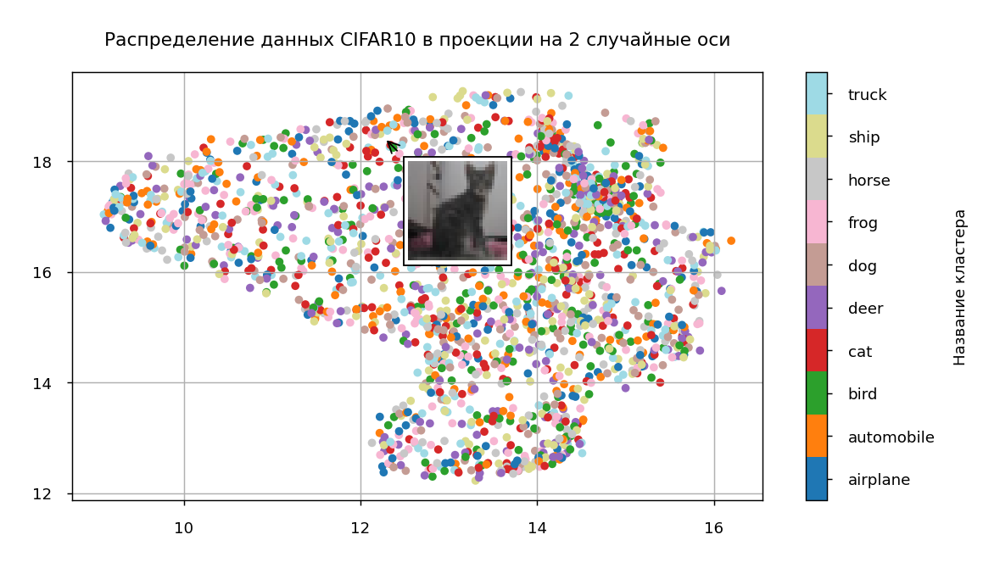

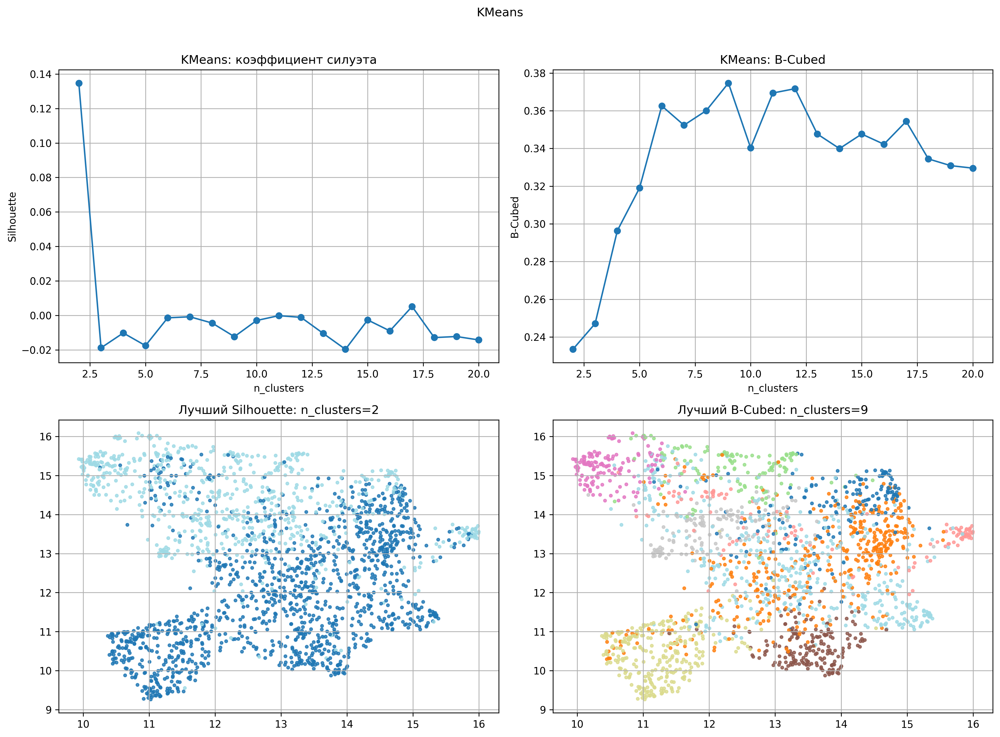

In [45]:
kmeans_n_clusters = np.arange(2, 21)

kmeans_predictions = []
kmeans_silhouette = []
kmeans_bcubed = []

for n_clusters in kmeans_n_clusters:
    predicted_labels = KMeans(
        n_clusters=n_clusters,
        n_init=10,
        random_state=random_state
    ).fit_predict(scaled_data)

    kmeans_predictions.append(predicted_labels)

    kmeans_silhouette.append(
        silhouette_score_from_distances(
            pairwise_distances_scaled,
            predicted_labels
        )
    )

    kmeans_bcubed.append(
        bcubed_score(labels, predicted_labels)
    )

kmeans_silhouette = np.array(kmeans_silhouette)
kmeans_bcubed = np.array(kmeans_bcubed)
kmeans_predictions = np.array(kmeans_predictions, dtype=object)

best_kmeans_silhouette, best_kmeans_bcubed = plot_metric_search_1d(
    'KMeans',
    kmeans_n_clusters,
    kmeans_silhouette,
    kmeans_bcubed,
    kmeans_predictions,
    'n_clusters',
    visual_data
)

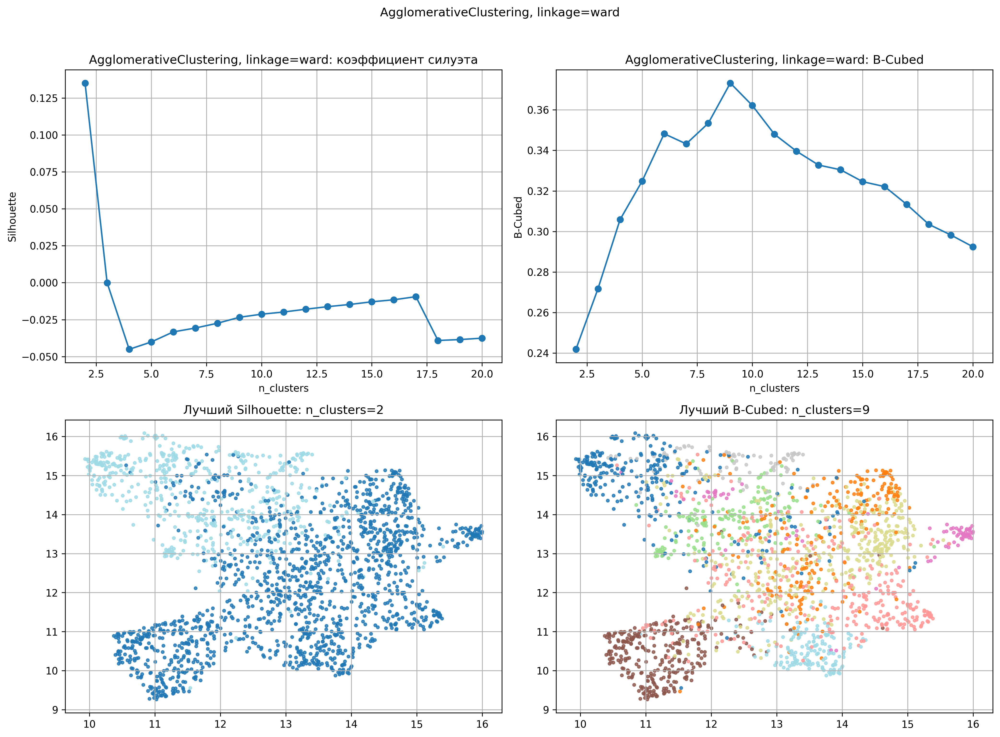

In [46]:
agglomerative_n_clusters = np.arange(2, 21)

agglomerative_predictions = []
agglomerative_silhouette = []
agglomerative_bcubed = []

for n_clusters in agglomerative_n_clusters:
    predicted_labels = AgglomerativeClustering(
        n_clusters=n_clusters,
        linkage='ward'
    ).fit_predict(scaled_data)

    agglomerative_predictions.append(predicted_labels)

    agglomerative_silhouette.append(
        silhouette_score_from_distances(
            pairwise_distances_scaled,
            predicted_labels
        )
    )

    agglomerative_bcubed.append(
        bcubed_score(labels, predicted_labels)
    )

agglomerative_silhouette = np.array(agglomerative_silhouette)
agglomerative_bcubed = np.array(agglomerative_bcubed)
agglomerative_predictions = np.array(agglomerative_predictions, dtype=object)

best_agglomerative_silhouette, best_agglomerative_bcubed = plot_metric_search_1d(
    'AgglomerativeClustering, linkage=ward',
    agglomerative_n_clusters,
    agglomerative_silhouette,
    agglomerative_bcubed,
    agglomerative_predictions,
    'n_clusters',
    visual_data
)

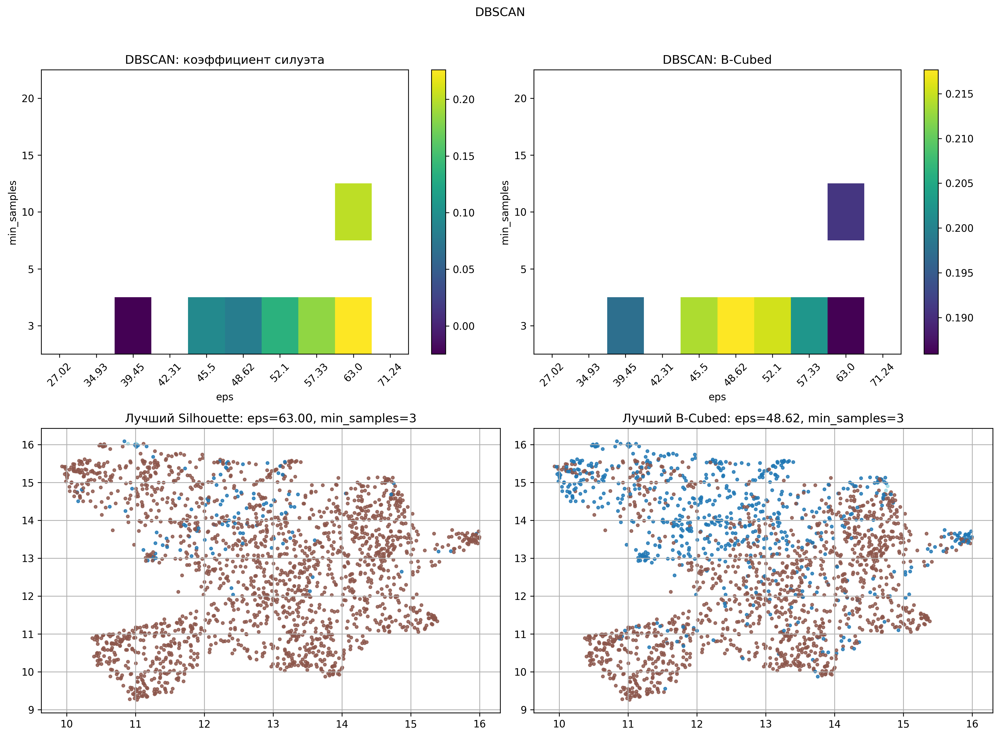

In [47]:
from sklearn.neighbors import NearestNeighbors

dbscan_min_samples_values = np.array([3, 5, 10, 15, 20])

nearest_neighbors = NearestNeighbors(
    n_neighbors=dbscan_min_samples_values.max(),
    n_jobs=-1
)

nearest_neighbors.fit(scaled_data)

neighbor_distances, _ = nearest_neighbors.kneighbors(scaled_data)

k_distances = neighbor_distances[:, -1]

dbscan_eps_values = np.quantile(
    k_distances,
    np.linspace(0.05, 0.95, 10)
)

dbscan_eps_values = np.unique(dbscan_eps_values)

dbscan_silhouette = np.full(
    (dbscan_min_samples_values.size, dbscan_eps_values.size),
    np.nan
)

dbscan_bcubed = np.full_like(
    dbscan_silhouette,
    np.nan,
    dtype=float
)

dbscan_predictions = np.empty(
    dbscan_silhouette.shape,
    dtype=object
)

for i, min_samples in enumerate(dbscan_min_samples_values):
    for j, eps in enumerate(dbscan_eps_values):
        predicted_labels = DBSCAN(
            eps=eps,
            min_samples=min_samples
        ).fit_predict(scaled_data)

        dbscan_predictions[i, j] = predicted_labels

        if non_noise_cluster_count(predicted_labels) >= 2:
            dbscan_silhouette[i, j] = silhouette_score_from_distances(
                pairwise_distances_scaled,
                predicted_labels
            )

            dbscan_bcubed[i, j] = bcubed_score(
                labels,
                predicted_labels
            )

if np.all(np.isnan(dbscan_silhouette)):
    best_dbscan_silhouette = None
    best_dbscan_bcubed = None
else:
    best_dbscan_silhouette, best_dbscan_bcubed = plot_dbscan_search(
        dbscan_eps_values,
        dbscan_min_samples_values,
        dbscan_silhouette,
        dbscan_bcubed,
        dbscan_predictions,
        visual_data
    )

In [48]:
print(
    f'KMeans: '
    f'silhouette={best_kmeans_silhouette}, '
    f'B-Cubed={best_kmeans_bcubed}'
)

print(
    f'AgglomerativeClustering: '
    f'silhouette={best_agglomerative_silhouette}, '
    f'B-Cubed={best_agglomerative_bcubed}'
)

print(
    f'DBSCAN: '
    f'silhouette={best_dbscan_silhouette}, '
    f'B-Cubed={best_dbscan_bcubed}'
)

KMeans: silhouette=2, B-Cubed=9
AgglomerativeClustering: silhouette=2, B-Cubed=9
DBSCAN: silhouette=(np.float64(62.999961853027344), np.int64(3)), B-Cubed=(np.float64(48.622313499450684), np.int64(3))


#### <font color='DarkOrange'>**Задание 2.8 [кросспроверка, 1 балл][вопрос]** </font>
1. Какие алгоритмы справились с кластеризацией естественных данных?
2. Получилось ли подобрать оптимальное число кластеров с помощью BCubed и коэффициента силуэта?
3. Объясните почему коэффициент силуэта не позволил выполнить подбор оптимальных гиперпараметров.

<font color='MediumOrchid'>**Ваш ответ здесь:**</font>

1. Среди всех алгоритмов лучше всего себя показали KMeans и AgglomerativeClustering: они дали разбиение на 9 кластеров (по B-Cubed), что выглядит правдоподобно.
2. По B-Cubed получилось для двух алгоритмов, а коэффициент силуэта не дал хорошего разбиения на кластеры.
3. Причина в том, что коэффициент силуэта оценивает только геометрическое качество кластеризации, т.е. насколько объекты близки внутри своего кластера и насколько далеко находятся от других кластеров. Он не использует истинные метки классов. Для естественных изображений классы не обязаны быть компактными сферическими группами в пространстве признаков.

Интересный способ визуализации Иерархической кластеризации — построение дендрограммы. Такой способ визуализации позволяет анализировать, как именно связаны между собой объекты, подбирать оптимальное число кластеров, а также определять, какие классы отделяются "хорошо" от других классов, а какие классы перемешаны в одном кластере.

In [49]:
def plot_dendrogram(model, labels, classes, ax):
    n_classes = len(classes)
    n_samples = len(model.labels_)
    n_u_connections = model.children_.shape[0]
    colors = plt.get_cmap('tab20', n_classes).colors

    bin_counts = np.zeros([n_u_connections, n_classes])
    for i, merge in enumerate(model.children_):
        current_bin_count = np.zeros(n_classes)
        for child_idx in merge:
            if child_idx < n_samples:
                current_bin_count[labels[child_idx]] += 1
            else:
                current_bin_count += bin_counts[child_idx - n_samples]

        bin_counts[i] = current_bin_count

    linkage_matrix = np.column_stack(
        [model.children_, model.distances_, np.sum(bin_counts, axis=1)]
    ).astype(float)

    def leaf_label_func(idx):
        if idx < len(labels):
            return None
        else:
            ratio = 100 * np.max(bin_counts[idx - n_samples]) / np.sum(bin_counts[idx - n_samples])
            if ratio < 100:
                return '{0:.0f}%'.format(ratio)
            else:
                return None

    def link_color_func(idx):
        mode_class = np.argmax(bin_counts[idx - n_samples])
        return matplotlib.colors.to_hex(colors[mode_class], keep_alpha=True)

    scipy.cluster.hierarchy.dendrogram(
        linkage_matrix, ax=ax, link_color_func=link_color_func, leaf_label_func=leaf_label_func,
        orientation='right', truncate_mode="level", p=9
    )

    for idx, class_name in enumerate(classes):
        ax.plot([], [], c=matplotlib.colors.to_hex(colors[idx], keep_alpha=True), label=class_name)
    ax.legend()

    # Удалим накладывающиеся метки
    threshold = 55
    prev_position = -(threshold + 1)

    y_labels = ax.get_yaxis().get_ticklabels()
    for label in y_labels:
        if label.get_text() == '':
            continue

        _, position = label.get_position()
        if position - prev_position < threshold:
            label.set_text('')
        else:
            prev_position = position
    ax.get_yaxis().set_ticklabels(y_labels)

    ax.set_xlabel('Расстояние между кластерами')
    ax.set_ylabel('Доля объектов наибольшего класса в данном кластере')

    ax.set_title('Дендрограмма Иерархической Кластеризации')

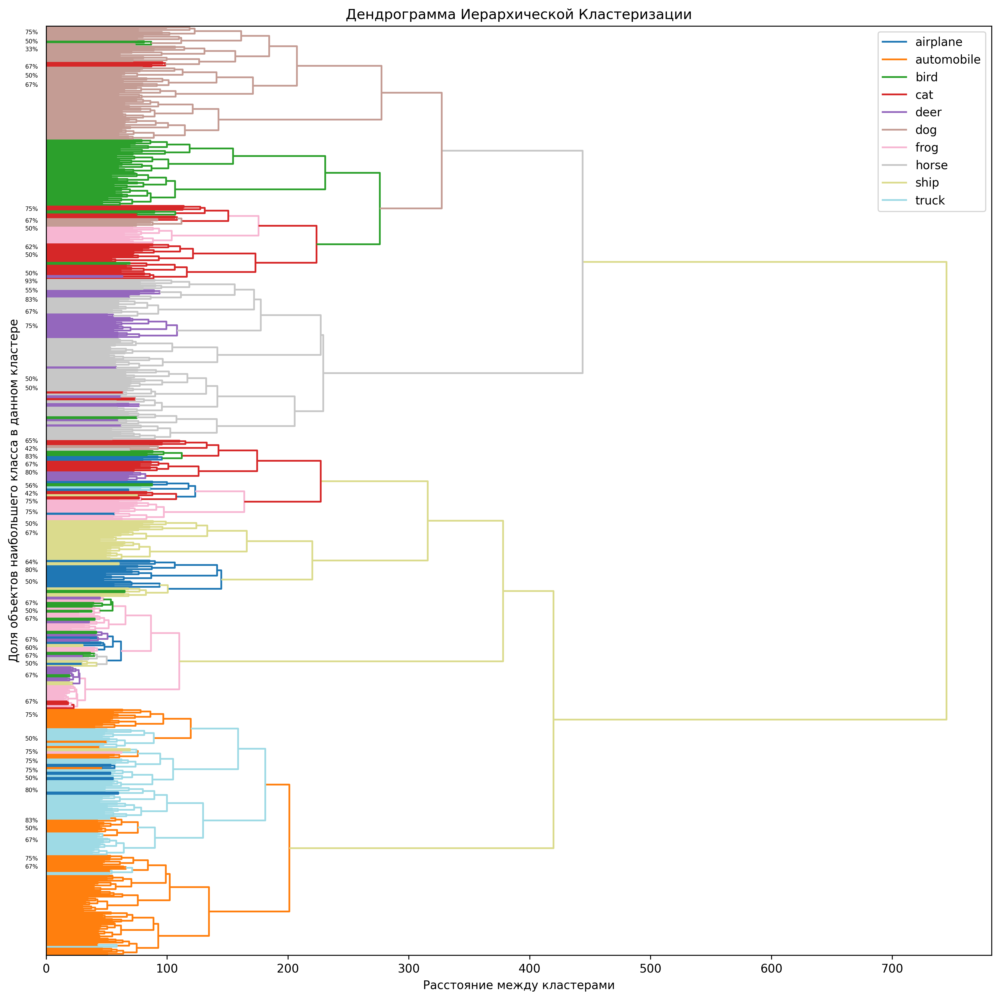

In [50]:
n_objects = 2000
model = AgglomerativeClustering(
    n_clusters=None, distance_threshold=0.0, compute_distances=True, compute_full_tree=True
)
model = model.fit(cifar10_deep_features_train[:n_objects])

fig, ax = plt.subplots(1, 1, figsize=(12, 12))

plot_dendrogram(
    model,
    labels=cifar10_labels_train[:n_objects],
    classes=cifar10_train_dataset.classes,
    ax=ax
)

fig.tight_layout()
plt.show()

#### <font color='DarkOrange'>**Задание 2.9 [кросспроверка, 0.5 балла][вопрос]** </font>

Проанализируйте получившуюся дендрограмму. Напишите свои наблюдения ниже.

<font color='MediumOrchid'>**Ваш ответ здесь:**</font>

На малых расстояниях происходит большое количество слияний. Это означает, что в данных есть группы близких объектов, которые алгоритм быстро объединяет в небольшие кластеры, причем эти объекты принадлежат одному истинному классу.

Некоторые классы формируют крупные и однородные ветви: automobile, bird, truck и airplane. Значит, для этих классов глубокие признаки сохраняют смысловую близость изображений.

Кластеры не являются полностью чистыми. Это означает, что разные классы частично пересекаются в пространстве признаков.

Дендрограмма показывает иерархический характер данных, т.е. сначала объединяются очень похожие объекты на малых расстояниях, затем эти маленькие и относительно чистые группы сливаются в более крупные кластеры. Причем при увеличении расстояния между объединяемыми кластерами чистота ветвей снижается.